In [1]:
# importing useful libraries
import numpy
import pandas
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [2]:
import warnings
warnings.filterwarnings('ignore', category=Warning)


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
# uploading the dataset
data = pandas.read_excel(r"/content/drive/MyDrive/assignment.xlsx")

In [5]:
# making a copy
data_copy = data.copy(deep=True)

In [6]:
data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 64 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   Case No                                     10000 non-null  object        
 1   Claim No                                    10000 non-null  object        
 2   Registration Number                         10000 non-null  int64         
 3   NHPM Id                                     10000 non-null  object        
 4   Family Id                                   10000 non-null  object        
 5   Patient District                            10000 non-null  object        
 6   Gender                                      10000 non-null  object        
 7   Age(Years)                                  10000 non-null  int64         
 8   Category Details                            10000 non-null  object        
 9   Procedu

#### Above shown that Few features have missing values.

In [7]:
for features in data_copy.columns:
    print(features,"   :   ",data_copy[features].isnull().sum()*100/data_copy.shape[0])

Case No    :    0.0
Claim No    :    0.0
Registration Number    :    0.0
NHPM Id    :    0.0
Family Id    :    0.0
Patient District    :    0.0
Gender    :    0.0
Age(Years)    :    0.0
Category Details    :    0.0
Procedure Details    :    0.12
Case Type    :    0.0
Case Status    :    0.0
Hospital Name    :    0.0
Hospital Code    :    0.0
Hospital District    :    0.0
IP Registration Date    :    0.0
Admission Date    :    0.0
Preauth Date    :    0.0
Preauth Amount(Rs.)    :    0.0
Preauth Approve Date    :    4.61
Preauth Approved Amount(Rs.)    :    0.0
Preauth Rejected Date    :    100.0
Surgery Date    :    7.41
Death Date    :    99.4
Discharge Date    :    7.97
Claim Submitted Date    :    8.12
Actual Claim Submitted Date    :    8.12
Claim Initaiated Amount(Rs.)    :    8.12
CPD Approved Amount(Rs.)    :    20.32
Claim Approved Amount(Rs.)    :    0.0
Assigned Flag    :    99.91
Assigned User    :    99.91
Assigned Group    :    99.91
IP Number    :    100.0
Actual Registrat

- Some of the columns have 99% or 100 % missing values. We need to drop them straight away as that is not useful.

In [8]:

columns_to_drop = [
    'Preauth Rejected Date',
    'Death Date',
    'Discharge Date',
    'Assigned Flag',
    'Assigned User',
    'Assigned Group',
    'IP Number',
    'Trigger',
    'Time taken for PPD approval',
    'Patinet Count data',
    'Family count',
    'Test 1',
    'Test 2',
    'Test 3',
    'Test 4',
    'Test 5',
    'Test 6',
    'Test'
]

# Drop the specified columns
data_new = data_copy.drop(columns=columns_to_drop)

# Now, your DataFrame 'data' will have the specified columns removed


In [9]:
data_new.isnull().sum()

Case No                                          0
Claim No                                         0
Registration Number                              0
NHPM Id                                          0
Family Id                                        0
Patient District                                 0
Gender                                           0
Age(Years)                                       0
Category Details                                 0
Procedure Details                               12
Case Type                                        0
Case Status                                      0
Hospital Name                                    0
Hospital Code                                    0
Hospital District                                0
IP Registration Date                             0
Admission Date                                   0
Preauth Date                                     0
Preauth Amount(Rs.)                              0
Preauth Approve Date           

# Visualising missing values

<Axes: >

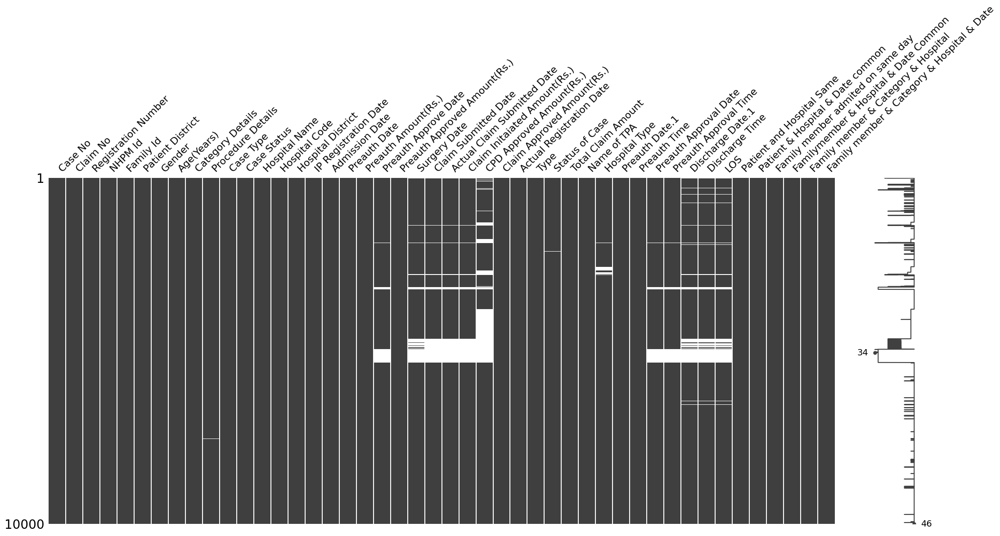

In [10]:
import missingno as no
no.matrix(data_new)

<Axes: >

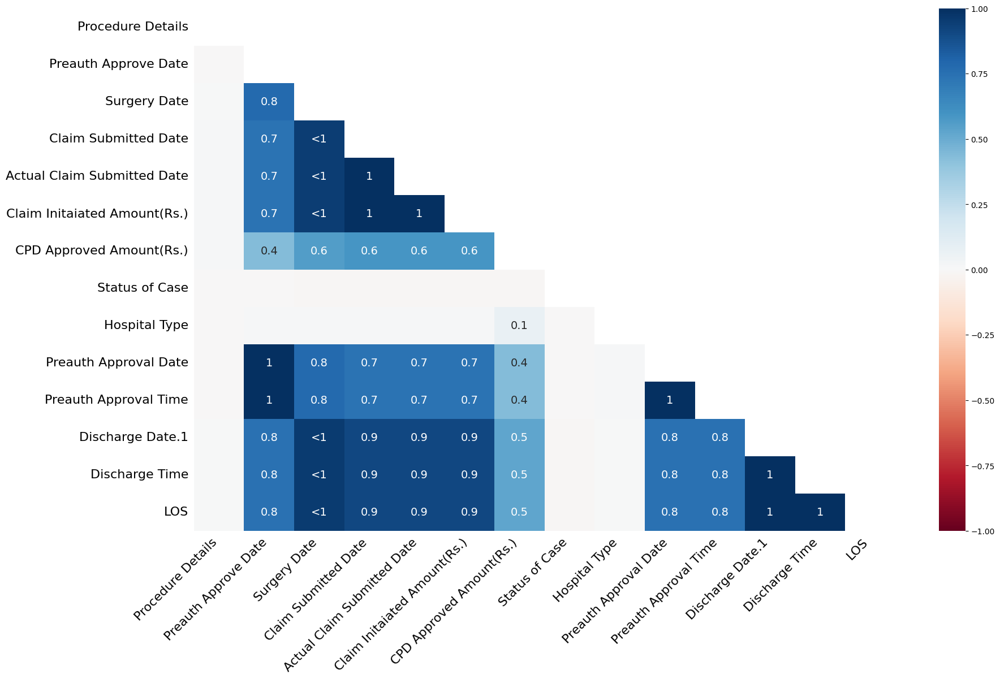

In [11]:
no.heatmap(data_new)

- A clear pattern found in missing data for columns
- for the surgery date claim submission date actual submission date and others having missing values not at random. We need to remove these rows

In [12]:
data_clean = data_new.dropna()

In [13]:
data_clean.shape

(7789, 46)

### First 5 rows

In [14]:
data_clean.iloc[:,:10].head()

,Case No,Claim No,Registration Number,NHPM Id,Family Id,Patient District,Gender,Age(Years),Category Details,Procedure Details
7,CASE/PS8/HOSP24P66027/MV2899607,TRUST/KAC/2023/4492878589/1,2763117,PPT48ROD5,24MV01291232582301759344,KACHCHH,FEMALE,60,Urology(SU),Chronic Haemodialysis(MG072D)
8,CASE/PS8/HOSP24P61827/MAV2951087,TRUST/ANA/2023/4402921001/1,2810309,PCEI6VPUC,24MAV23175229000000228,ANAND,MALE,48,Radiation Oncology(MR),3DCRT (3 Dimentional Conformal RT)(Consider wh...
9,CASE/PS8/HS24012082/MAV3171290,TRUST/JUN/2023/4483204340/1,3051363,PJ6PGA280,24MAV21000033000019316,JUNAGADH,MALE,33,Emergency Room Packages (Care requiring less t...,Animal bites (Excluding Snake Bite)(ER003A)
10,CASE/PS8/HOSP24G69606/MAV2921484,TRUST/GAN/2023/4462895283/1,2785434,PVST3FEFW,24MAV21193000000058470,GANDHINAGAR,FEMALE,31,Emergency Room Packages (Care requiring less t...,Animal bites (Excluding Snake Bite)(ER003A)
11,CASE/PS8/HS24008067/MAV2953097,TRUST/SUR/2023/4602922739/1,2817599,PI596ZR9K,24MAV19077000000011723,SURENDRANAGAR,MALE,52,Emergency Room Packages (Care requiring less t...,Animal bites (Excluding Snake Bite)(ER003A)


In [15]:
data_clean.iloc[:,10:20].head()

,Case Type,Case Status,Hospital Name,Hospital Code,Hospital District,IP Registration Date,Admission Date,Preauth Date,Preauth Amount(Rs.),Preauth Approve Date
7,SURGICAL,Claim Amount Paid by Bank(Insurance),STERLING RAMKRISHNA SPECIALITY HOSPITAL,HOSP24P66027,KACHCHH,12/07/2023,12/07/2023 12:00:00 AM,14/07/2023 03:30:21 PM,21450,14/07/2023 10:59:55 PM
8,MEDICAL,Claim Recommend reject by CPD(Insurance),Shree Krishna Hospital,HOSP24P61827,ANAND,20/07/2023,21/07/2023 12:00:00 AM,21/07/2023 02:33:55 PM,77000,21/07/2023 04:32:09 PM
9,MEDICAL,CPD Insurer Approved(Insurance),COMMUNITY HEALTH CENTER KESHOD,HS24012082,JUNAGADH,18/09/2023,18/09/2023 12:00:00 AM,18/09/2023 11:17:13 AM,1700,18/09/2023 12:01:35 PM
10,MEDICAL,Claim Approved by SHA Insurer(Insurance),Primary Health Centre Adaraj,HOSP24G69606,GANDHINAGAR,15/07/2023,15/07/2023 12:00:00 AM,17/07/2023 02:17:58 PM,1700,17/07/2023 02:17:58 PM
11,MEDICAL,CPD Insurer Approved(Insurance),Community Health Centre Dhangdhra,HS24008067,SURENDRANAGAR,22/07/2023,22/07/2023 12:00:00 AM,22/07/2023 09:19:57 AM,1700,22/07/2023 09:19:57 AM


In [16]:
data_clean.iloc[:,20:30].head()

,Preauth Approved Amount(Rs.),Surgery Date,Claim Submitted Date,Actual Claim Submitted Date,Claim Initaiated Amount(Rs.),CPD Approved Amount(Rs.),Claim Approved Amount(Rs.),Actual Registration Date,Type,Status of Case
7,21450,12/07/2023 12:00:00 AM,10/08/2023 03:30:06 PM,10/08/2023 03:30:06 PM,10725.0,5.0,5,12/07/2023 01:12:14 PM,ASHA,Paid
8,77000,27/07/2023 12:00:00 AM,18/10/2023 09:31:46 AM,04/09/2023 12:16:03 PM,77000.0,10.0,0,20/07/2023 12:17:54 PM,ASHA,Reject
9,1700,18/09/2023 12:00:00 AM,18/09/2023 02:15:52 PM,18/09/2023 02:15:52 PM,1700.0,40.0,0,18/09/2023 11:03:33 AM,ASHA,Out standing - Ready for payment
10,1700,15/07/2023 12:00:00 AM,20/10/2023 03:20:41 PM,19/07/2023 02:39:50 PM,1700.0,40.0,0,15/07/2023 11:48:32 AM,ASHA,Paid
11,1700,22/07/2023 12:00:00 AM,20/09/2023 04:22:41 PM,22/07/2023 10:57:14 AM,1700.0,40.0,0,22/07/2023 09:14:36 AM,ASHA,Out standing - Ready for payment


In [17]:
data_clean.iloc[:,30:40].head()

,Total Claim Amount,Name of TPA,Hospital Type,Preauth Date.1,Preauth Time,Preauth Approval Date,Preauth Approval Time,Discharge Date.1,Discharge Time,LOS
7,5,MDINDIA TPA,Private,2023-07-14,19:53:06,2023-07-14,22:59:55,2023-07-21,17:00:00,7.0
8,10,MDINDIA TPA,Private,2023-07-21,20:53:06,2023-07-21,16:32:09,2023-08-31,12:10:00,41.0
9,40,MDINDIA TPA,Public,2023-09-18,21:53:06,2023-09-18,12:01:35,2023-09-18,14:00:00,0.0
10,40,MDINDIA TPA,Public,2023-07-17,22:53:06,2023-07-17,14:17:58,2023-07-15,14:15:00,-2.0
11,40,MDINDIA TPA,Public,2023-07-22,23:53:06,2023-07-22,09:19:57,2023-07-22,09:20:00,0.0


In [18]:
data_clean.iloc[:,40:].head()

,Patient and Hospital Same,Patient & Hospital & Date common,Family member admited on same day,Familymember & Hospital & Date Common,Family member & Category & Hospital,Family member & Category & Hospital & Date
7,PPT48ROD5HOSP24P66027,PPT48ROD5HOSP24P6602745121,24MV0129123258230175934445121,24MV01291232582301759344HOSP24P6602745121,24MV01291232582301759344Urology(SU)HOSP24P66027,24MV01291232582301759344Urology(SU)HOSP24P6602...
8,PCEI6VPUCHOSP24P61827,PCEI6VPUCHOSP24P6182745128,24MAV2317522900000022845128,24MAV23175229000000228HOSP24P6182745128,24MAV23175229000000228Radiation Oncology(MR)HO...,24MAV23175229000000228Radiation Oncology(MR)HO...
9,PJ6PGA280HS24012082,PJ6PGA280HS2401208245187,24MAV2100003300001931645187,24MAV21000033000019316HS2401208245187,24MAV21000033000019316Emergency Room Packages ...,24MAV21000033000019316Emergency Room Packages ...
10,PVST3FEFWHOSP24G69606,PVST3FEFWHOSP24G6960645124,24MAV2119300000005847045124,24MAV21193000000058470HOSP24G6960645124,24MAV21193000000058470Emergency Room Packages ...,24MAV21193000000058470Emergency Room Packages ...
11,PI596ZR9KHS24008067,PI596ZR9KHS2400806745129,24MAV1907700000001172345129,24MAV19077000000011723HS2400806745129,24MAV19077000000011723Emergency Room Packages ...,24MAV19077000000011723Emergency Room Packages ...


In [19]:
pip install nbformat --upgrade


In [20]:
numerical_columns = ['Age(Years)', 'Preauth Amount(Rs.)', 'Preauth Approved Amount(Rs.)',
                    'Claim Initaiated Amount(Rs.)', 'CPD Approved Amount(Rs.)',
                    'Claim Approved Amount(Rs.)', 'Total Claim Amount', 'LOS']

for col in numerical_columns:
    fig = px.histogram(data_clean, x=col, title=f'{col} Distribution', nbins=50)
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='Frequency',
    )
    fig.show()


In [21]:

# Plot bar plots for categorical columns
categorical_columns = ['Gender', 'Category Details', 'Status of Case', 'Name of TPA', 'Hospital Type']

for col in categorical_columns:
    fig = px.bar(data_clean[col].value_counts().reset_index(), x='index', y=col, text=col, title=f'{col} Count')
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='Count',
        xaxis_categoryorder='total descending',
        xaxis_title_standoff=30,
    )
    fig.update_traces(texttemplate='%{text}', textposition='outside')
    fig.show()

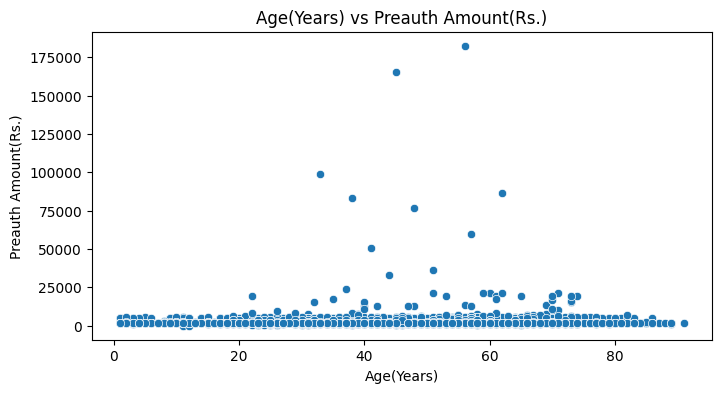

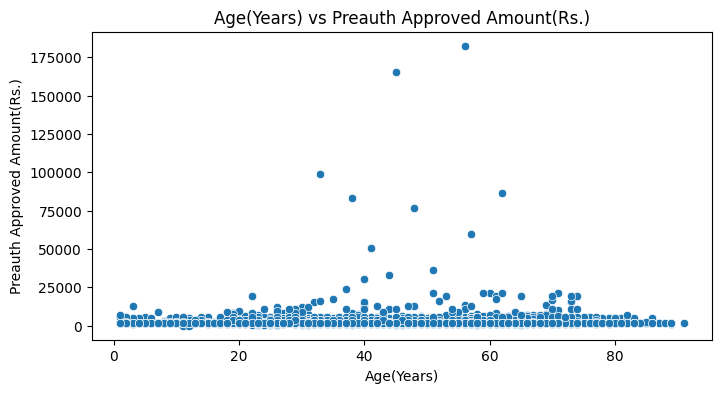

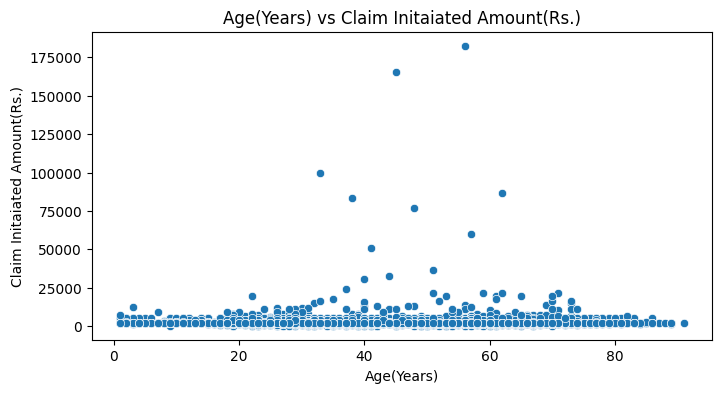

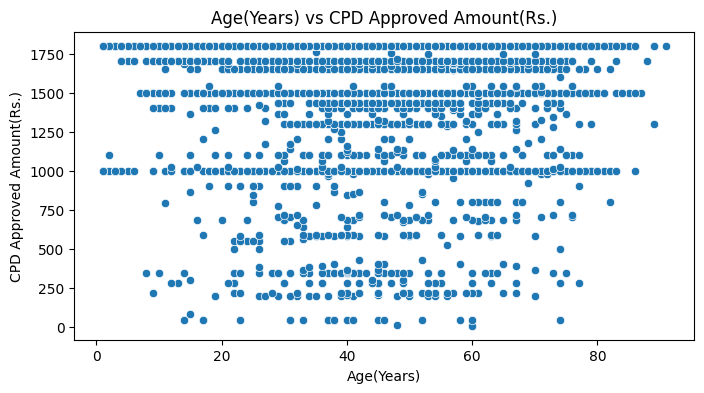

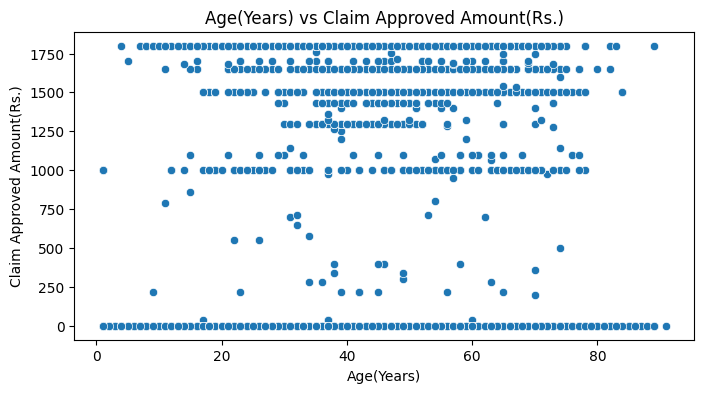

...

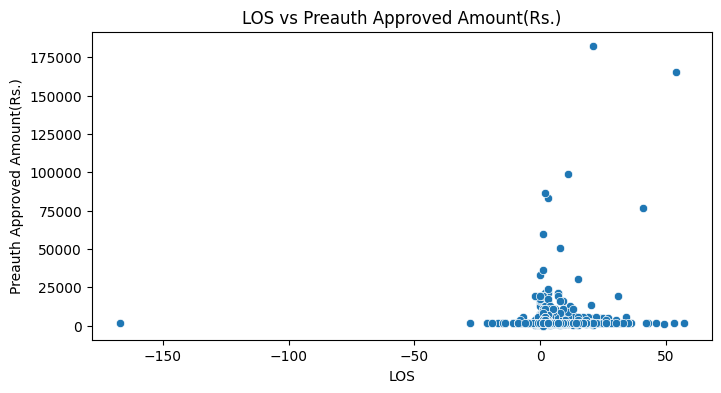

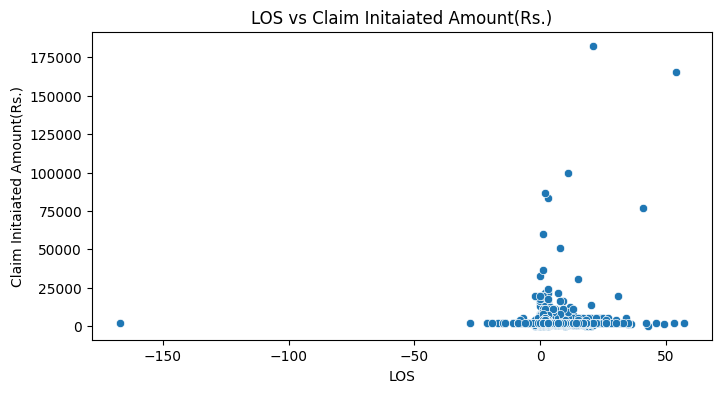

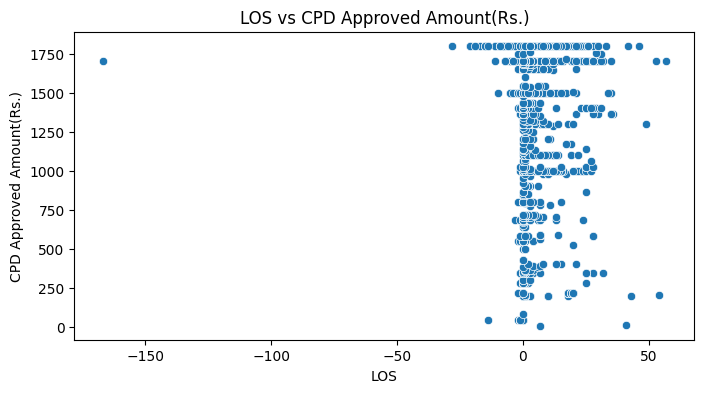

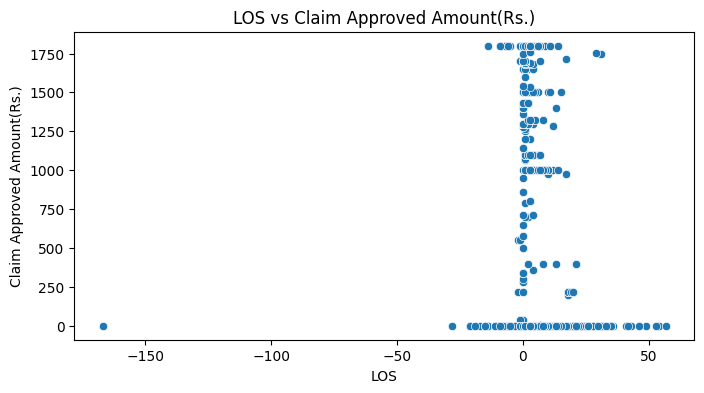

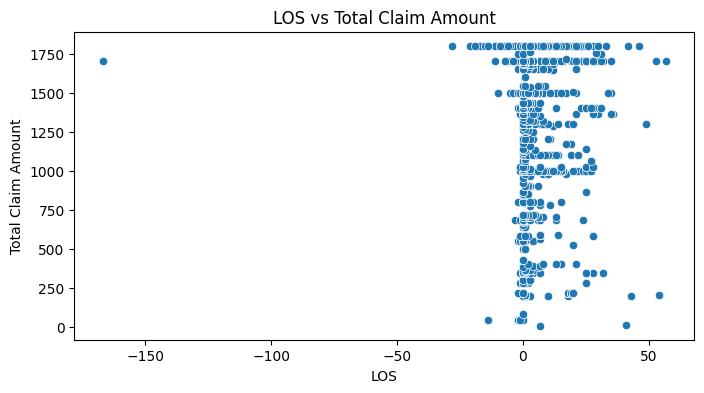

In [22]:
# Create scatter plots to visualize relationships between numerical columns
for col1 in numerical_columns:
    for col2 in numerical_columns:
        if col1 != col2:
            plt.figure(figsize=(8, 4))
            sns.scatterplot(data=data_clean, x=col1, y=col2)
            plt.title(f'{col1} vs {col2}')
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.show()


In [23]:
numerical_columns = ['Age(Years)', 'Preauth Amount(Rs.)',
       'Preauth Approved Amount(Rs.)', 'Claim Initaiated Amount(Rs.)',
       'CPD Approved Amount(Rs.)', 'Claim Approved Amount(Rs.)',
       'Total Claim Amount', 'LOS']

categorical_columns = ['Case Type', 'Case Status', 'Gender', 'Hospital Type']

for cat_col in categorical_columns:
    for num_col in numerical_columns:
        fig = px.box(data_clean, x=cat_col, y=num_col, title=f'{cat_col} vs {num_col}')
        fig.update_xaxes(title=cat_col)
        fig.update_yaxes(title=num_col)
        fig.show()

In [24]:
# Convert date columns to datetime if not already
data_clean['Admission Date'] = pandas.to_datetime(data_clean['Admission Date'])
data_clean['Preauth Date.1'] = pandas.to_datetime(data_clean['Preauth Date.1'])
data_clean['Discharge Date.1'] = pandas.to_datetime(data_clean['Discharge Date.1'])
data_clean['Claim Submitted Date'] = pandas.to_datetime(data_clean['Claim Submitted Date'])
data_clean['Actual Claim Submitted Date'] = pandas.to_datetime(data_clean['Actual Claim Submitted Date'])
data_clean['Preauth Approval Date'] = pandas.to_datetime(data_clean['Preauth Approval Date'])


In [25]:
# Extract month from date columns
data_clean['Admission Month'] = data_clean['Admission Date'].dt.to_period('M')
data_clean['Preauth Month'] = data_clean['Preauth Date.1'].dt.to_period('M')
data_clean['Discharge Month'] = data_clean['Discharge Date.1'].dt.to_period('M')
data_clean['Claim Submitted Month'] = data_clean['Claim Submitted Date'].dt.to_period('M')
data_clean['Actual Claim Submitted Month'] = data_clean['Actual Claim Submitted Date'].dt.to_period('M')
data_clean['Preauth Approval Month'] = data_clean['Preauth Approval Date'].dt.to_period('M')


In [26]:
# Create line plots to visualize monthly trends
data_clean['Admission Month'] = data_clean['Admission Month'].dt.strftime('%Y-%m')

fig = px.bar(data_clean['Admission Month'].value_counts().reset_index(), x='index', y='Admission Month',
             labels={'index': 'Month', 'Admission Month': 'Count'}, title='Monthly Admission Trends')

fig.update_xaxes(tickangle=45)
fig.show()

In [27]:
date_columns = ['Preauth Month', 'Discharge Month', 'Claim Submitted Month', 'Actual Claim Submitted Month', 'Preauth Approval Month']

for column in date_columns:
    data_clean[column] = data_clean[column].dt.strftime('%Y-%m')

    fig = px.bar(data_clean[column].value_counts().reset_index(), x='index', y=column,
                 labels={'index': 'Month', column: 'Count'}, title=f'Monthly {column} Trends')

    fig.update_xaxes(tickangle=45)
    fig.show()

In [28]:
fig = px.box(data_clean, x='Case Status', y='Total Claim Amount', labels={'Case Status': 'Case Status', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Case Status vs. Total Claim Amount')
fig.show()

In [29]:
# Univariate analysis for Total Claim Amount
fig = px.bar(data_clean, x='Hospital District', y='Total Claim Amount', labels={'Hospital District': 'Hospital District', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Hospital District vs. Total Claim Amount')
fig.update_xaxes(tickangle=90)
fig.update_traces(marker_color='blue')  # Set the color of the bars to blue
fig.show()

In [30]:
# Bivariate analysis between Claim Status and Total Claim Amount
fig = px.box(data_clean, x='Status of Case', y='Total Claim Amount', labels={'Status of Case': 'Status of Case', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Status of Case vs. Total Claim Amount')
fig.update_xaxes(tickangle=45)
fig.show()

In [31]:

fig = px.box(data_clean, x='Gender', y='Total Claim Amount', labels={'Gender': 'Gender', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Gender vs. Total Claim Amount')
fig.show()

In [32]:
# Bivariate analysis between Category Details and Total Claim Amount
fig = px.bar(data_clean, x='Category Details', y='Total Claim Amount', labels={'Category Details': 'Category Details', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Category Details vs. Total Claim Amount')
fig.update_xaxes(categoryorder='total ascending')
fig.show()

In [33]:
# Bivariate analysis between Hospital Type and Total Claim Amount
fig = px.box(data_clean, x='Hospital Type', y='Total Claim Amount', labels={'Hospital Type': 'Hospital Type', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Hospital Type vs. Total Claim Amount')
fig.show()

In [72]:
import pandas as pd

# Convert 'Surgery Date' to datetime format and extract the month
data_clean['Surgery Month'] = pd.to_datetime(data_clean['Surgery Date']).dt.to_period('M').astype(str)



In [73]:
# Bivariate analysis between 'Surgery Month' and 'Total Claim Amount'
monthly_data = data_clean.groupby('Surgery Month').agg({'Case No': 'count', 'Total Claim Amount': 'sum'}).reset_index()

# Create a bar chart
fig = px.bar(monthly_data, x='Surgery Month', y='Total Claim Amount', text='Case No',
             labels={'Surgery Month': 'Month', 'Total Claim Amount': 'Total Claim Amount (Rs.)', 'Case No': 'Total Surgeries'},
             title='Monthly Total Surgeries and Total Claim Amount')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.show()

In [37]:
# Bivariate analysis between Actual Claim Submitted Date and Total Claim Amount
data_clean['Claim Submitted Date'] = pandas.to_datetime(data_clean['Claim Submitted Date'])

# Create a scatter plot
fig = px.scatter(data_clean, x='Claim Submitted Date', y='Total Claim Amount', labels={'Claim Submitted Date': 'Claim Submitted Date', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Claim Submitted Date vs. Total Claim Amount')
fig.update_xaxes(rangeslider_visible=True)  # Add a range slider to zoom in on the x-axis (Claim Submitted Date)
fig.show()

In [38]:
# Bivariate analysis between Preauth Amount(Rs.) and Total Claim Amount
fig = px.scatter(data_clean, x='Preauth Amount(Rs.)', y='Total Claim Amount', labels={'Preauth Amount(Rs.)': 'Preauth Amount (Rs.)', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Preauth Amount (Rs.) vs. Total Claim Amount')
fig.show()

In [39]:
# Bivariate analysis between Preauth Approved Amount(Rs.) and Total Claim Amount
fig = px.scatter(data_clean, x='Preauth Approved Amount(Rs.)', y='Total Claim Amount', labels={'Preauth Approved Amount(Rs.)': 'Preauth Approved Amount (Rs.)', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Preauth Approved Amount (Rs.) vs. Total Claim Amount')
fig.show()

In [40]:
# Bivariate analysis between Claim Initiated Amount(Rs.) and Total Claim Amount
fig = px.scatter(data_clean, x=data_clean['Claim Initaiated Amount(Rs.)'], y=data_clean['Total Claim Amount'], labels={'Claim Initaiated Amount(Rs.)': 'Claim Initaiated Amount (Rs.)', 'Total Claim Amount': 'Total Claim Amount (Rs.)'}, title='Claim Initaiated Amount (Rs.) vs. Total Claim Amount')
fig.show()

In [41]:
# keeping only necessary columns for machine learning algorithms
filtered_data = data_clean[['Age(Years)', 'Gender', 'Case Type', 'Name of TPA', 'LOS', 'Preauth Amount(Rs.)', 'Preauth Approved Amount(Rs.)', 'Claim Initaiated Amount(Rs.)', 'Claim Approved Amount(Rs.)', 'Total Claim Amount']]


In [42]:
# droppping transgenders as that is low in count
filtered_data = filtered_data.drop(filtered_data[filtered_data['Gender'] == 'TRANSGENDER'].index)

In [43]:
# Encoding

cols = ['Gender','Case Type','Name of TPA']
data_encoded = pandas.get_dummies(filtered_data, columns=cols)

In [44]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


In [45]:
# splittiong featutres and target
X_train, X_test, y_train, y_test = train_test_split(data_encoded.drop('Total Claim Amount', axis=1), data_encoded['Total Claim Amount'], test_size=0.25, random_state=42)

In [46]:
rf=RandomForestRegressor()

In [47]:
rf.fit(X_train, y_train)

RandomForestRegressor()

In [48]:
y_pred=rf.predict(X_test)

In [49]:
r2_score(y_test,y_pred)    # test accuracy

0.6947325090208607

In [50]:
pred_x = rf.predict(X_train)
r2_score(y_train,pred_x)         # train accuracy

0.9008985532945888

In [57]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid for Random Forest Regression
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the Random Forest model
model = RandomForestRegressor()

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


In [58]:
y_pred = best_model.predict(X_test)

# Calculate the R2 score
r2_rf = r2_score(y_test, y_pred)
print(f"R2 Score for Random Forest Regression: {r2_rf}")

R2 Score for Random Forest Regression: 0.7423496458631028


In [59]:
from sklearn.tree import DecisionTreeRegressor

# Define the hyperparameter grid for Decision Tree Regression
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the Decision Tree model
model = DecisionTreeRegressor()

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [60]:
y_pred = best_model.predict(X_test)

# Calculate the R2 score
r2 = r2_score(y_test, y_pred)
print(f"R2 Score for Decision Tree Regression: {r2}")

R2 Score for Decision Tree Regression: 0.7192892608311482


In [61]:
import xgboost as xgb

# Define the hyperparameter grid for XGBoost Regression
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.05, 0.1, 0.2]
}

# Create the XGBoost model
model = xgb.XGBRegressor()

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [62]:
y_pred = best_model.predict(X_test)

# Calculate the R2 score
r2_xgb = r2_score(y_test, y_pred)
print(f"R2 Score for xgboost Regression: {r2_xgb}")

R2 Score for xgboost Regression: 0.7431928807936197


In [63]:
from sklearn.ensemble import AdaBoostRegressor

# Define the hyperparameter grid for AdaBoost Regression
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Create the AdaBoost model
model = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


In [64]:
y_pred = best_model.predict(X_test)

# Calculate the R2 score
r2_ada = r2_score(y_test, y_pred)
print(f"R2 Score for adaboost Regression: {r2_ada}")

R2 Score for adaboost Regression: 0.6261325842786274


In [65]:
n =  7789   # total number of observation
p = 12  # number of features
adj_r2_xgb =  1 - ((1 - r2_xgb) * (n - 1) / (n - p - 1))
print(f"Final accuracy for the xgboost model is {round(adj_r2_xgb*100,2)} %")

Final accuracy for the xgboost model is 74.28 %


## Task accomplished:
- Removed the missing values as missing values were not random.
- univariate analysis has been done for numerical and categorical features.
- Monthly trend has been ploted.
- categorical features has been encoded
- scaling has been done.
- Found fine accuracy for XGBOOST model after hyper parameter tuning.







***************************Thank You***********************************









